## Dimensionality reduction

In [1]:
import os
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['OPENBLAS_NUM_THREADS'] = '1'

In [2]:
import scanpy as sc
import anndata as ad
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from rpy2.robjects import r
import harmonypy as hm
import pandas as pd
import random


## set global random seed to 42

In [3]:
sc.settings.seed = 42

In [4]:
np.random.seed(42)
random.seed(42)
os.environ["PYTHONHASHSEED"] = "42"

In [13]:
adata = sc.read_h5ad("/projects/circ_iri/work/sc_analysis_final/feature_selection/adata_concat_feature_selection.h5ad")

In [14]:
adata.X = adata.layers["scran_normalization"]

## PCA

In [15]:
# setting highly variable as highly deviant to use scanpy 'use_highly_variable' argument in sc.pp.pca
adata.var["highly_variable"] = adata.var["highly_deviant"]
sc.pp.pca(adata, svd_solver="arpack", mask_var="highly_variable", n_comps= 200)

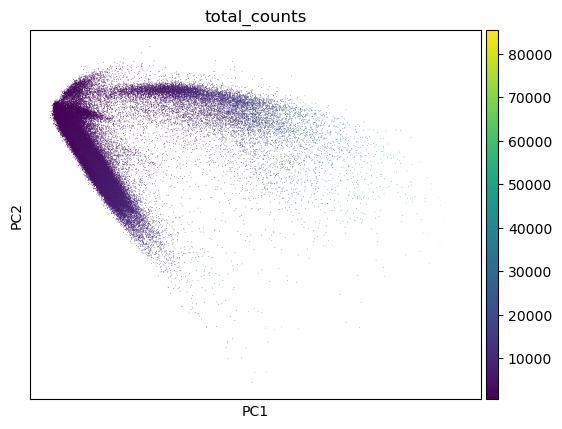

In [16]:
sc.pl.pca_scatter(adata, color="total_counts")

In [17]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/dim_reduction/PCA_total_counts_1_2_plot.png")

<Figure size 640x480 with 0 Axes>

## Elbowplot

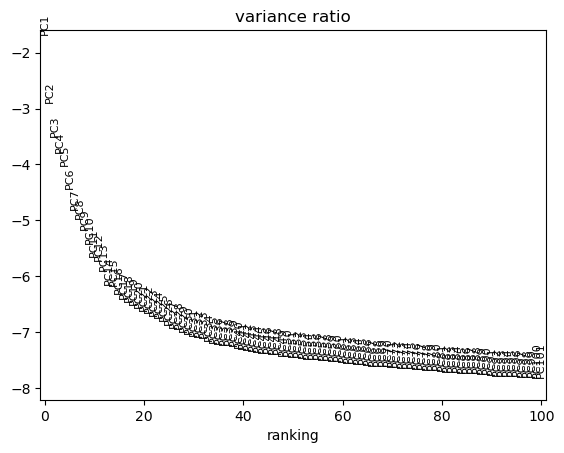

In [18]:
# elbow plot
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=100)

In [19]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/dim_reduction/PCA_Elbow_plot.png")

<Figure size 640x480 with 0 Axes>

## Harmony - Batch Correction

In [20]:
# Get PCs from the AnnData object
pcs = adata.obsm['X_pca']
print(pcs.shape)  # (n_cells, n_pcs)

(111118, 200)


In [21]:
adata.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,...,log1p_total_counts_hb,pct_counts_hb,outlier,mt_outlier,soupx_groups,scDblFinder_score,scDblFinder_class,sample,condition,size_factors
AAACCAAAGCGCCTGA-1-S26_17,1741,7.462789,2887.0,7.968319,15.587115,21.440942,27.779702,37.062695,57.014202,28.0,...,1.386294,0.103914,False,False,0,0.000075,singlet,S26_17,Sham_LNP_circGFP,1.029940
AAACCAAAGGCGAGAC-1-S26_17,1458,7.285507,2360.0,7.766840,14.745763,20.932203,28.093220,38.474576,59.406780,32.0,...,0.693147,0.042373,False,False,0,0.000025,singlet,S26_17,Sham_LNP_circGFP,0.975881
AAACCAAAGGCTCCGA-1-S26_17,2520,7.832411,5668.0,8.642768,18.719125,25.723359,32.163020,40.508116,56.527876,48.0,...,1.098612,0.035286,False,False,3,0.000205,singlet,S26_17,Sham_LNP_circGFP,1.009939
AAACCAAAGGTGCAGA-1-S26_17,886,6.787845,1103.0,7.006695,10.063463,17.225748,26.291931,37.805984,65.004533,16.0,...,0.000000,0.000000,False,False,4,0.000159,singlet,S26_17,Sham_LNP_circGFP,0.734563
AAACCAAAGTCGCATA-1-S26_17,1109,7.012115,1730.0,7.456455,14.104046,21.502890,30.635838,42.890173,64.797688,32.0,...,0.000000,0.000000,False,False,6,0.000225,singlet,S26_17,Sham_LNP_circGFP,0.830534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTGTACGTTAGCCCA-1-S26_32,755,6.628041,1182.0,7.075809,14.720812,24.619289,35.109983,52.030457,78.426396,7.0,...,0.693147,0.084602,False,False,0,0.000064,singlet,S26_32,IRI_LNP_circINSR,0.829994
TGTGTTAGTAGGTCCC-1-S26_32,2209,7.700748,4861.0,8.489205,16.251800,22.197079,29.129809,38.407735,55.996708,38.0,...,2.079442,0.144003,False,False,4,0.000091,singlet,S26_32,IRI_LNP_circINSR,1.217066
TGTGTTAGTATGTCCG-1-S26_32,1395,7.241366,2239.0,7.714231,9.870478,16.971862,25.279142,37.114783,60.026798,37.0,...,1.609438,0.178651,False,False,1,0.003640,singlet,S26_32,IRI_LNP_circINSR,0.952302
TGTGTTAGTTAACCCG-1-S26_32,721,6.582025,1021.0,6.929517,14.397649,24.191969,34.769833,48.971596,78.354554,21.0,...,1.791759,0.489716,False,False,3,0.000025,singlet,S26_32,IRI_LNP_circINSR,0.680152


In [22]:
# Run Harmony on the PCA embedding
harmony_out = hm.run_harmony(pcs[:, 0:50], adata.obs, "sample", max_iter_harmony = 20)

2026-04-22 11:55:47,950 - harmonypy - INFO - Running Harmony (PyTorch on cpu)
2026-04-22 11:55:47,951 - harmonypy - INFO -   Parameters:
2026-04-22 11:55:47,952 - harmonypy - INFO -     max_iter_harmony: 20
2026-04-22 11:55:47,953 - harmonypy - INFO -     max_iter_kmeans: 20
2026-04-22 11:55:47,954 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-04-22 11:55:47,955 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-04-22 11:55:47,955 - harmonypy - INFO -     nclust: 100
2026-04-22 11:55:47,956 - harmonypy - INFO -     block_size: 0.05
2026-04-22 11:55:47,957 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-04-22 11:55:47,958 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2. 2. 2.]
2026-04-22 11:55:47,959 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
2026-04-22 11:55:47,960 - harmonypy - INFO -     verbose: True
2026-04-22 11:55:47,960 - harmonypy - INFO -     random_state: 0
2026-04-22 11:55:47,961 - harmonypy - INFO -   Data: 50 PCs × 111118 cells

2026-04-22 11:55:48,332 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-04-22 11:55:52,323 - harmonypy - INFO - KMeans initialization complete.
2026-04-22 11:55:52,910 - harmonypy - INFO - Iteration 1 of 20
2026-04-22 11:56:15,284 - harmonypy - INFO - Iteration 2 of 20
2026-04-22 11:56:35,562 - harmonypy - INFO - Iteration 3 of 20
2026-04-22 11:56:53,880 - harmonypy - INFO - Iteration 4 of 20
2026-04-22 11:57:08,992 - harmonypy - INFO - Iteration 5 of 20
2026-04-22 11:57:19,833 - harmonypy - INFO - Iteration 6 of 20
2026-04-22 11:57:30,322 - harmonypy - INFO - Iteration 7 of 20
2026-04-22 11:57:39,323 - harmonypy - INFO - Iteration 8 of 20
2026-04-22 11:57:48,502 - harmonypy - INFO - Iteration 9 of 20
2026-04-22 11:57:57,247 - harmonypy - INFO - Iteration 10 of 20
2026-04-22 11:58:06,568 - harmonypy - INFO - Iteration 11 of 20
2026-04-22 11:58:14,957 - harmonypy - INFO - Iteration 12 of 20
2026-04-22 11:58:23,045 - harmonypy - INFO - Iteration 13 of 20
2026

In [23]:
# Store corrected PCs back in the AnnData object
adata.obsm['X_pca_harmony'] = harmony_out.Z_corr

## UMAP - batch corrected


In [24]:
# Use harmonized PCs for downstream analysis
sc.pp.neighbors(adata, use_rep='X_pca_harmony', random_state=42)
sc.tl.umap(adata, random_state=42)
sc.tl.leiden(adata, flavor="igraph", n_iterations=2, random_state=42)

/home/aumlauf/miniforge3/envs/circ_iri/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


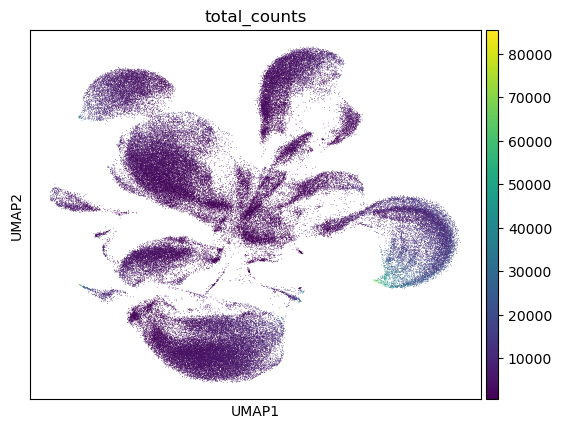

In [25]:
sc.pl.umap(adata, color="total_counts")

In [26]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/dim_reduction_batch_corrected/UMAP_total_counts_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

## Inspecting quality control metrics - batch corrected

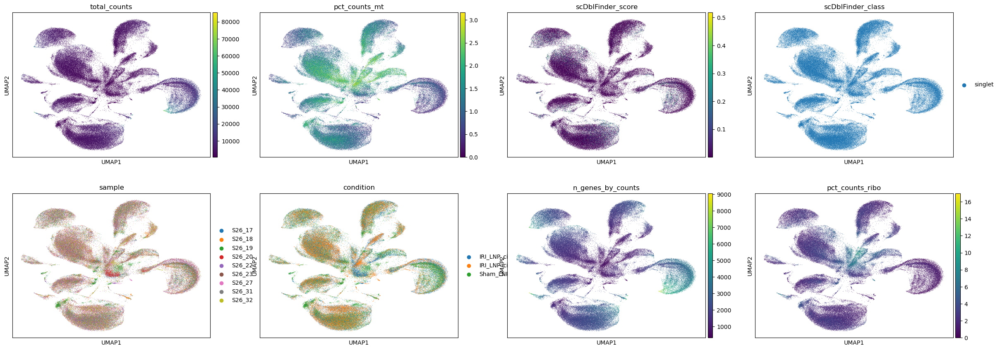

In [30]:
sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class", "sample", "condition", "n_genes_by_counts", "pct_counts_ribo"],
)

In [31]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/dim_reduction_batch_corrected/UMAP_overview_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

## Clustering - batch corrected

In [32]:
sc.tl.leiden(
    adata, key_added="leiden_res0_25", resolution=0.25, flavor="igraph", n_iterations=2, random_state=42
)
sc.tl.leiden(
    adata, key_added="leiden_res0_5", resolution=0.5, flavor="igraph", n_iterations=2, random_state=42
)
sc.tl.leiden(
    adata, key_added="leiden_res1", resolution=1.0, flavor="igraph", n_iterations=2, random_state=42
)
sc.tl.leiden(
    adata, key_added="leiden_res2", resolution=2.0, flavor="igraph", n_iterations=2, random_state=42
)

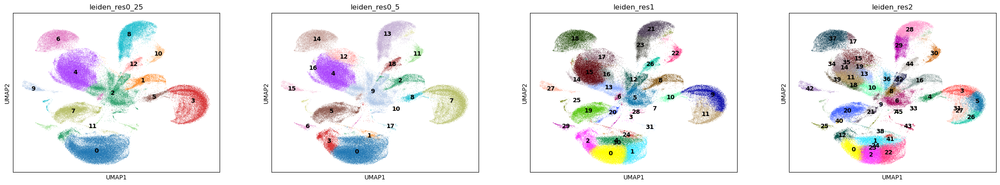

In [33]:
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_5", "leiden_res1", "leiden_res2"],
    legend_loc="on data",
)

In [34]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/UMAP_different_res_0_25_0_5_1_2_batch_corrected.png")

<Figure size 640x480 with 0 Axes>

## try different resolutions 0.3 - 0.8, because 0.5 looks already ok

In [35]:
leiden_res_list = ["0_3", "0_4", "0_5", "0_6", "0_7", "0_8"]

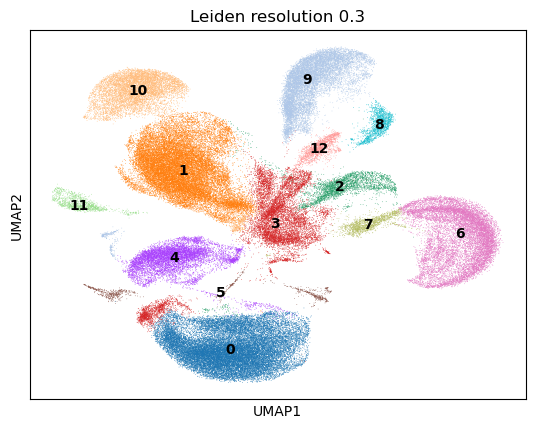

<Figure size 640x480 with 0 Axes>

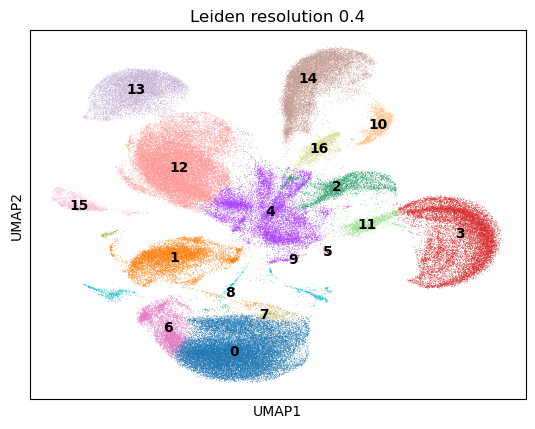

<Figure size 640x480 with 0 Axes>

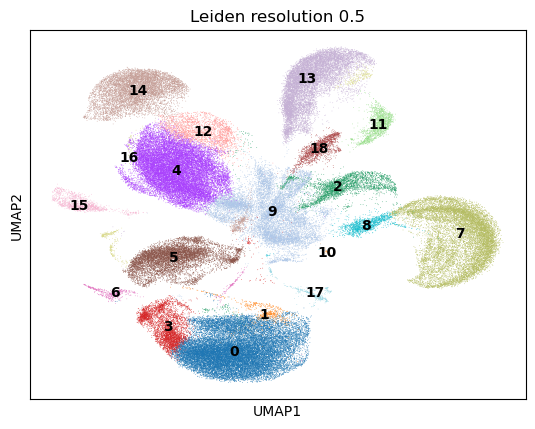

<Figure size 640x480 with 0 Axes>

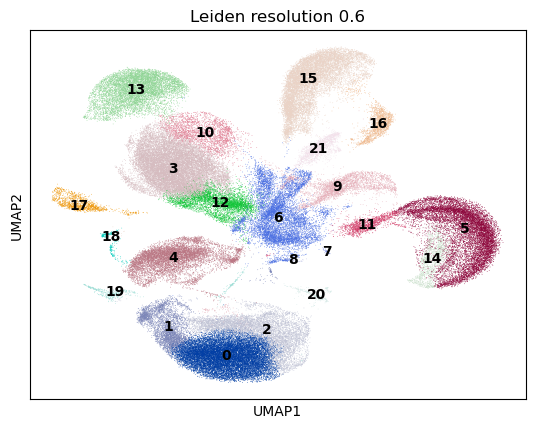

<Figure size 640x480 with 0 Axes>

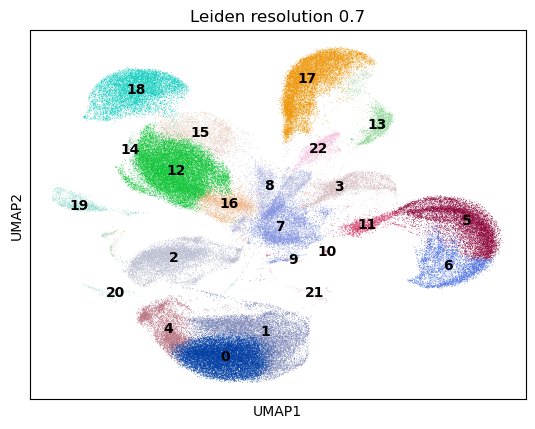

<Figure size 640x480 with 0 Axes>

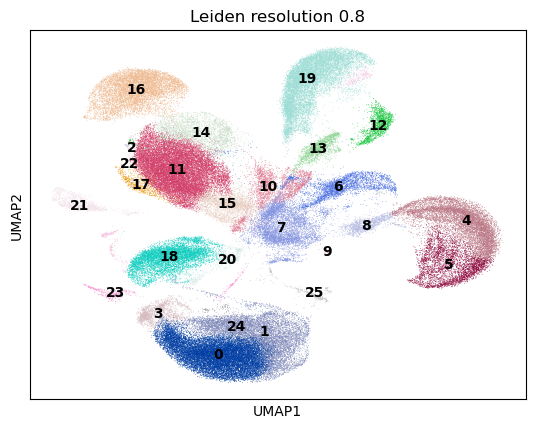

<Figure size 640x480 with 0 Axes>

In [36]:

for leiden_res in leiden_res_list:
    key = f"leiden_res{leiden_res}"
    sc.tl.leiden(
    adata, 
    key_added=key, 
    resolution=float(leiden_res.replace("_", ".")), 
    flavor="igraph", 
    n_iterations=2,
    random_state=42,
    )

    sc.pl.umap(
    adata,
    color=[key],
    legend_loc="on data",
    title=f"Leiden resolution {leiden_res.replace('_','.')}"
    )

    plt.savefig(f"/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/UMAP_{key}.png")
    
    

## Comparison different Leiden-Cluster

In [ ]:
metrics = [
    "total_counts",
    "n_genes_by_counts",
    "pct_counts_ribo",
    "pct_counts_mt"
]

In [38]:


df = adata.obs[["leiden_res0_6"] + metrics].copy()

df_long = df.melt(
    id_vars="leiden_res0_6",
    value_vars=metrics,
    var_name="metric",
    value_name="value"
)

/tmp/ipykernel_2349331/2106195682.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")


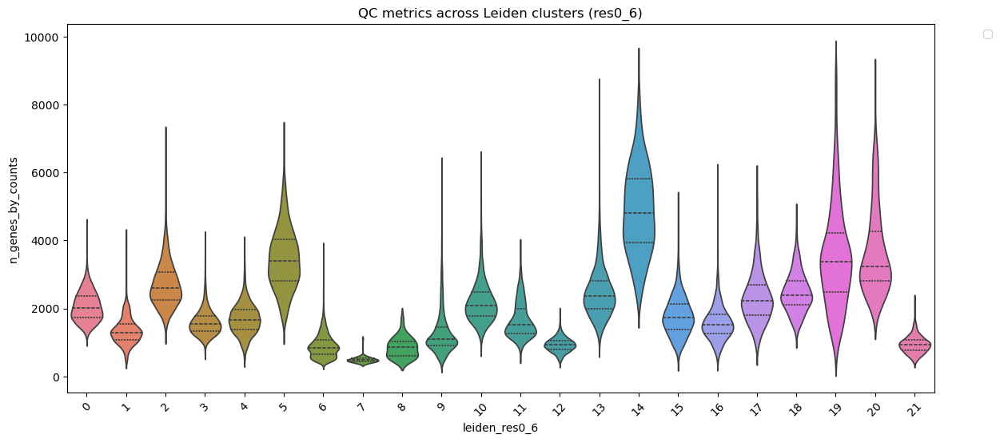

In [39]:
plt.figure(figsize=(14,6))

sns.violinplot(
    data=df,
    x="leiden_res0_6",
    y="n_genes_by_counts",
    hue="leiden_res0_6",
    split=False,
    inner="quartile"
)

plt.xticks(rotation=45)
plt.title("QC metrics across Leiden clusters (res0_6)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()

In [40]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/leiden_res0_6_comparison_qc_metric_n_genes_by_counts_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

## Cell-Cycle Scoring 

In [41]:
with open("/home/aumlauf/scripts/sc_analysis_final/cell_cycle_genes_regev_lab.txt", "r", encoding="utf-8") as f:
    cell_cycle_genes = f.read().splitlines()

print(cell_cycle_genes)

['MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'NASP', 'RAD51AP1', 'GMNN', 'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1', 'E2F8', 'HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2', 'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'HN1', 'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA']


In [42]:
cell_cycle_genes = [gene.capitalize() for gene in cell_cycle_genes]

In [43]:
s_genes = [x for x in cell_cycle_genes[:43] if x in adata.var_names]
g2m_genes = [x for x in cell_cycle_genes[43:] if x in adata.var_names]
cell_cycle_genes = [*s_genes, *g2m_genes]

In [44]:
adata_cc = adata.copy()
adata_cc.X = adata_cc.layers["log1p_norm"]

In [45]:
sc.tl.score_genes_cell_cycle(adata_cc, s_genes=s_genes, g2m_genes=g2m_genes)

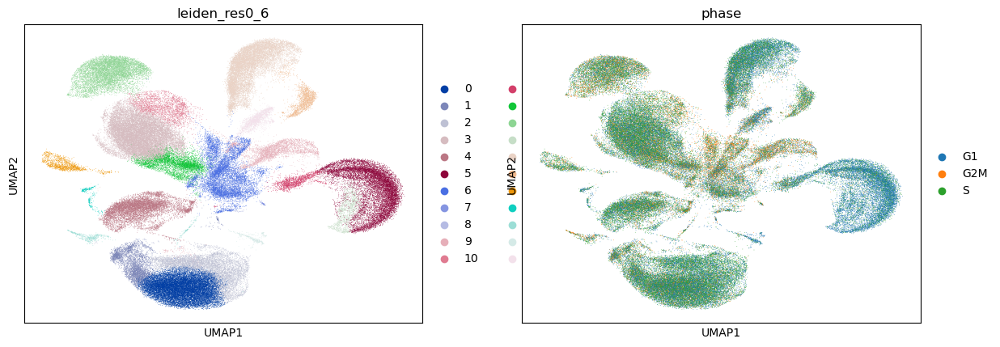

In [46]:
sc.pl.umap(
    adata_cc,
    color=["leiden_res0_6", "phase"],
    #legend_loc="on data",
)

In [47]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/UMAP_leiden_res0_6_cell_cycle_phase_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

In [115]:
adata.write("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/adata_concat_dim_reduction_cellcycle_scoring_clustering_batch_corrected.h5ad")

## AB HIER KANN ICH AUCH IN HANNOVER WEITERARBEITEN! DATEN AUS DEM VORHERIGEN SCHRITT WIEDER EINLESEN

In [14]:
adata = sc.read_h5ad("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/adata_concat_dim_reduction_cellcycle_scoring_clustering_batch_corrected.h5ad")

In [ ]:
#del adata.uns["dea_leiden_res0_6_filtered"]
# evtl wenn save nicht funktioniert

## Markergenes

## Paper1

In [48]:
# paper 1:

marker_genes_paper1 = {
    "endothelial_cells": ["Pecam1", "Vwf", "Dcn"],
    "ventricular_cardiomyocytes": ["Myh7", "Myl2", "Fhl2"],
    "fibroblasts": ["Dcn", "Gsn", "Pdgfra"],
    "pericytes": ["Rgs5", "Abcc9", "Kcnj8"],
    "mesothelial_cells": ["Msln", "Wt1", "Bnc1"],
    "myeloid_cells": ["C1qa"],
    "neurons": ["Plp1"]
}

### UMAP

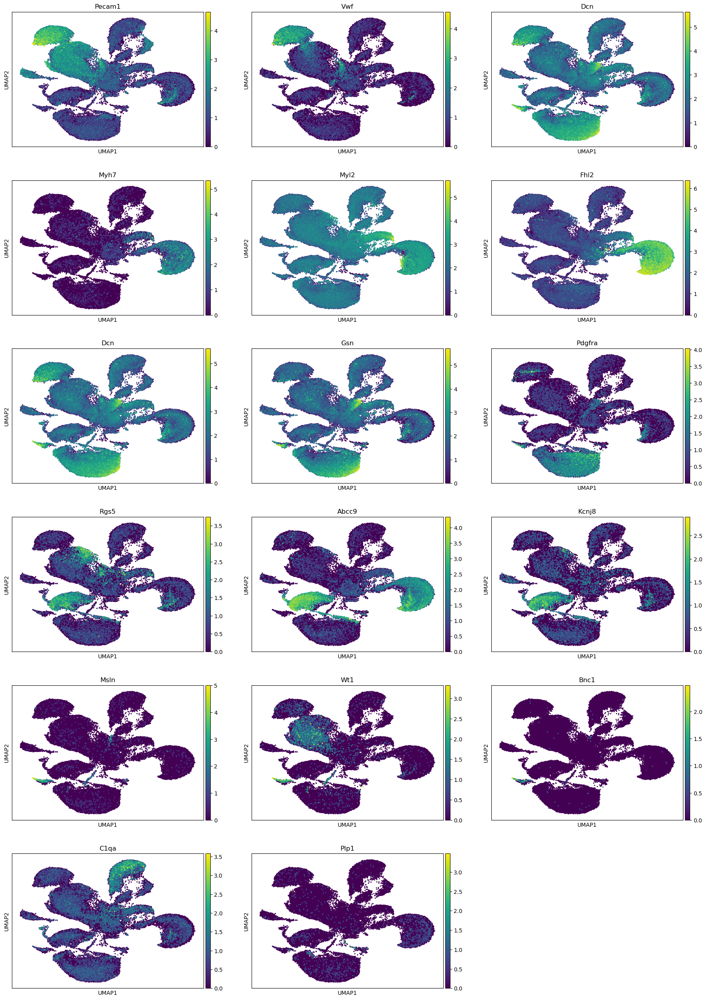

In [49]:
# Flatten gene list (for Scanpy plotting)
all_genes = sorted(set(g for genes in marker_genes_paper1.values() for g in genes))

# enforce NON-alphabetical order (your defined order)
ordered_genes = []
for cell_type in marker_genes_paper1:
    ordered_genes.extend(marker_genes_paper1[cell_type])

# keep only genes present in dataset, preserving order
ordered_genes = [g for g in ordered_genes if g in adata.var_names]

# UMAP feature plots in exact order
sc.pl.umap(
    adata,
    color=ordered_genes,
    ncols=3,
    cmap="viridis",
    size=20
)



In [50]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/UMAP_markergenes_paper1_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

### Dotplot

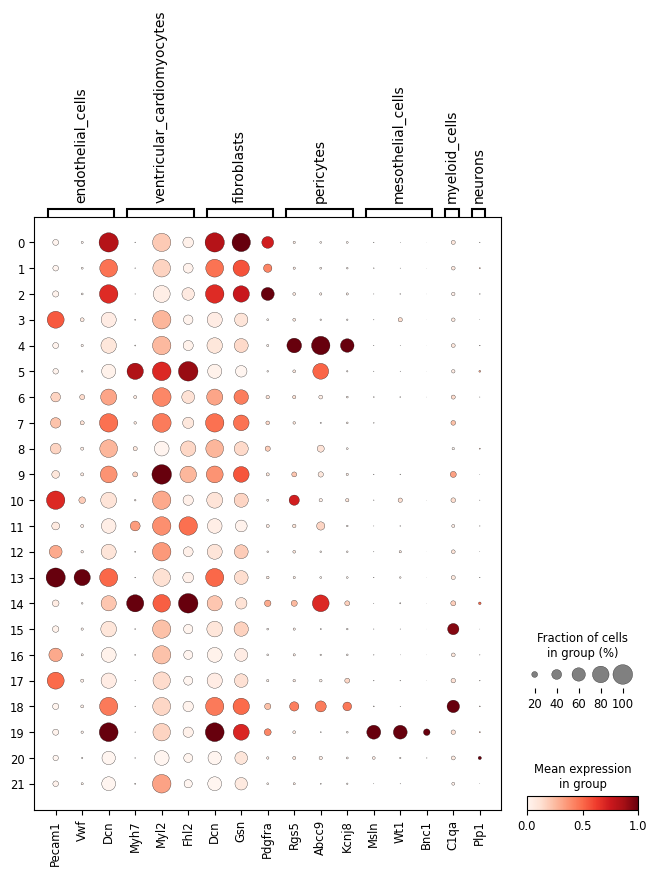

In [51]:
# 4) Dotplot grouped by Leiden clusters (0–15)
sc.pl.dotplot(
    adata,
    var_names=marker_genes_paper1,
    groupby="leiden_res0_6",
    standard_scale="var",
    dendrogram=False
)

In [52]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/dotplot_markergenes_paper1_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

## Paper2

In [53]:
marker_genes_paper2 = {
    "EC": ["Plvap", "Cdh5", "Npr3"],
    "vCM": ["Myl2", "Tnnt2", "Myh7"],
    "EndMT": ["Cthrc1", "Postn", "Twist1"],
    "aCM": ["Myh6", "Myl7", "Myl1"],  # inferred from cardiac marker structure in panel
    "Epi": ["Upk3b", "Upk1b", "Msln"],
    "VSMC": ["Fbln5", "Cxcl12", "Eln"],
    "EPDC": ["Tcf21","Pdgfra", "Dcn"],
    "Ery": ["Hbb-bt", "Hba-a2", "Alas2"],
    "SHF": ["Tbx5", "Osr1",],
    "Mac": ["C1qa", "C1qb", "Ccl4"]
}

## UMAP

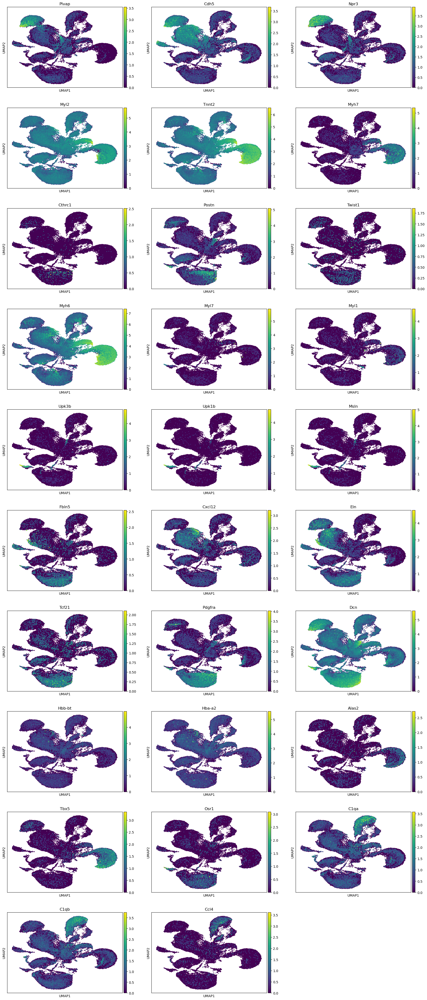

In [54]:
# Flatten gene list (for Scanpy plotting)
all_genes = sorted(set(g for genes in marker_genes_paper2.values() for g in genes))

# enforce NON-alphabetical order (your defined order)
ordered_genes = []
for cell_type in marker_genes_paper2:
    ordered_genes.extend(marker_genes_paper2[cell_type])

# keep only genes present in dataset, preserving order
ordered_genes = [g for g in ordered_genes if g in adata.var_names]

# 1) UMAP colored by each gene (feature plots)
sc.pl.umap(
    adata,
    color=ordered_genes,
    ncols=3,
    cmap="viridis",
    size=20
)

In [55]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/UMAP_markergenes_paper2_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

### Dotplot

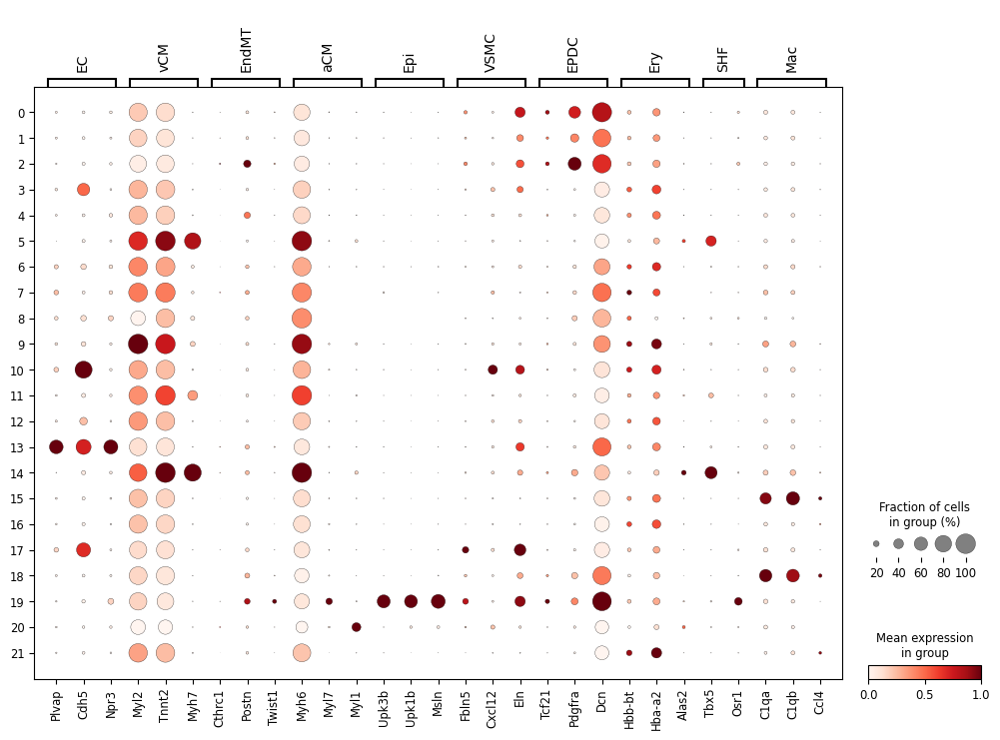

In [56]:
# 4) Dotplot grouped by Leiden clusters (0–15)
sc.pl.dotplot(
    adata,
    var_names=marker_genes_paper2,
    groupby="leiden_res0_6",
    standard_scale="var",
    dendrogram=False
)

In [57]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/dotplot_markergenes_paper2_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

## Dongchao marker genes

In [58]:
marker_genes_Dongchao = {
    "CM": ["Myh6"],
    "Fibro": ["Ddr2"],
    "Endo": ["Cd34"],
    "Macro": ["Adgre1"],  
    "B cells": ["Cd79a"],
    "T cells": ["Cd3g"],
}

## UMAP

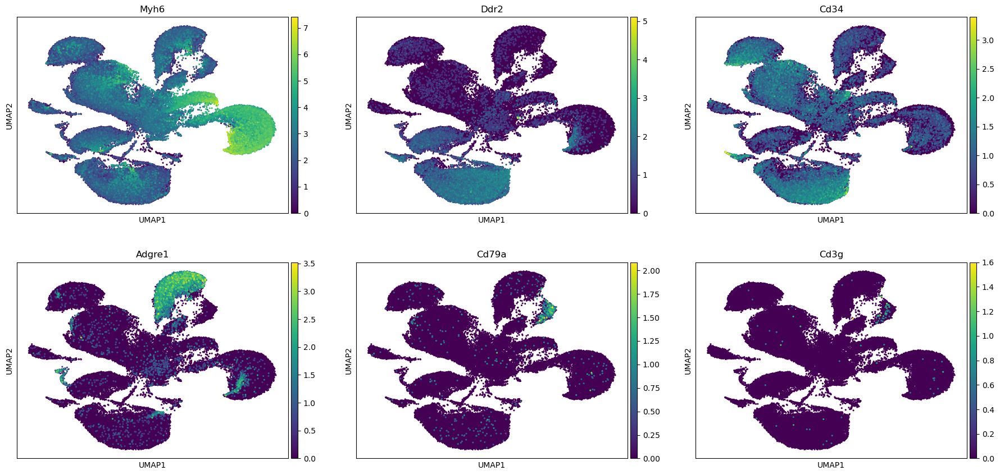

In [59]:
# Flatten gene list (for Scanpy plotting)
all_genes = sorted(set(g for genes in marker_genes_Dongchao.values() for g in genes))

# enforce NON-alphabetical order (your defined order)
ordered_genes = []
for cell_type in marker_genes_Dongchao:
    ordered_genes.extend(marker_genes_Dongchao[cell_type])

# keep only genes present in dataset, preserving order
ordered_genes = [g for g in ordered_genes if g in adata.var_names]

# UMAP feature plots in exact order
sc.pl.umap(
    adata,
    color=ordered_genes,
    ncols=3,
    cmap="viridis",
    size=20
)

In [60]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/UMAP_markergenes_Dongchao_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

## Dotplot

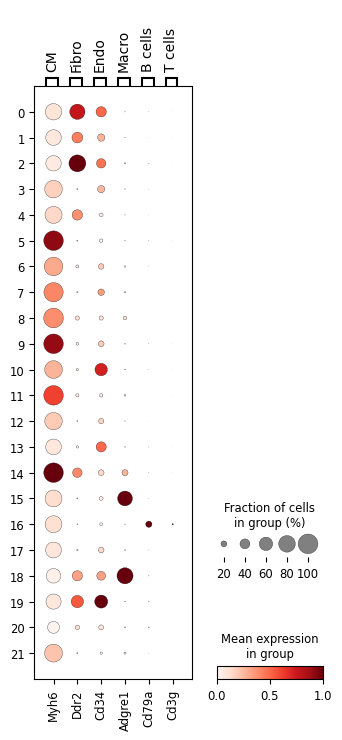

In [61]:
# 4) Dotplot grouped by Leiden clusters (0–15)
sc.pl.dotplot(
    adata,
    var_names=marker_genes_Dongchao,
    groupby="leiden_res0_6",
    standard_scale="var",
    dendrogram=False
)

In [62]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/dotplot_markergenes_Dongchao_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

## From cluster DEG to cluster annotation

In [63]:
adata.layers


Layers with keys: analytic_pearson_residuals, counts, log1p_norm, scran_normalization, soupX_counts

In [64]:
sc.tl.rank_genes_groups(
    adata, groupby="leiden_res0_6", method="wilcoxon", key_added="dea_leiden_res0_6", layer = "log1p_norm"
)

/home/aumlauf/miniforge3/envs/circ_iri/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/aumlauf/miniforge3/envs/circ_iri/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/aumlauf/miniforge3/envs/circ_iri/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:

In [65]:
adata.layers


Layers with keys: analytic_pearson_residuals, counts, log1p_norm, scran_normalization, soupX_counts

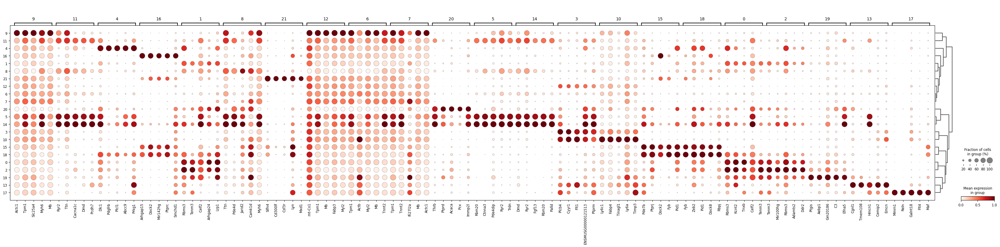

In [66]:
sc.tl.dendrogram(
    adata,
    groupby="leiden_res0_6",
)

sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res0_6", standard_scale="var", n_genes=5, key="dea_leiden_res0_6"
)

In [67]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/dotplot_from_DEG_to_cluster_5_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

In [68]:
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_res0_6",
    key_added="dea_leiden_res0_6_filtered",
)

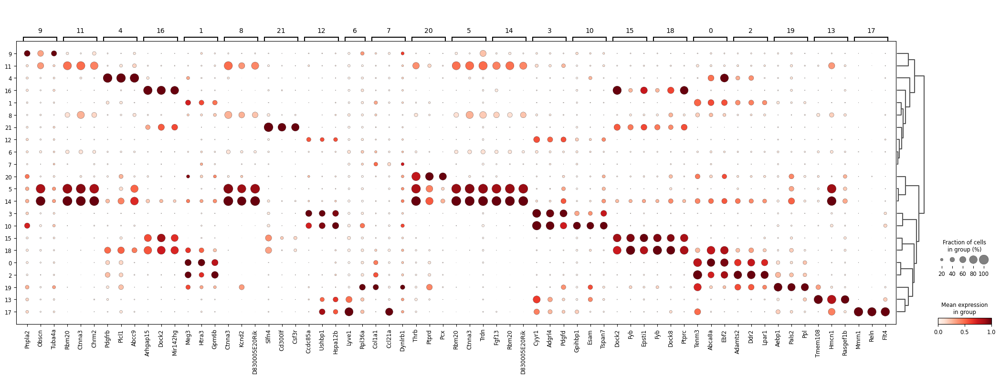

In [69]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_res0_6",
    standard_scale="var",
    n_genes=3,
    key="dea_leiden_res0_6_filtered",
)

In [70]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/dotplot_from_DEG_to_cluster_3_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

## Markergenes combined

In [71]:
marker_genes_combined = {
    # Endothel / vaskulär
    "endothelial_cells": [
        "Pecam1", "Vwf", "Plvap", "Cdh5", "Npr3", "Cd34"
    ],

    # Cardiomyocytes (ventrikulär + allgemein)
    "cardiomyocytes": [
        "Myh7", "Myl2", "Fhl2", "Tnnt2", "Myh6", "Myl7", "Myl1"
    ],

    # Fibroblasten / stromal
    "fibroblasts": [
        "Dcn", "Gsn", "Pdgfra", "Ddr2", "Postn", "Cthrc1"
    ],

    # Perizyten / vaskuläre glatte Muskelzellen
    "pericytes_vsmc": [
        "Rgs5", "Abcc9", "Kcnj8", "Fbln5", "Cxcl12", "Eln"
    ],

    # Mesothelial / epithelial-like
    "mesothelial_epithelial": [
        "Msln", "Wt1", "Bnc1", "Upk3b", "Upk1b"
    ],

    # Myeloid / Makrophagen
    "myeloid_cells": [
        "C1qa", "C1qb", "Ccl4", "Adgre1"
    ],

    # Lymphoid (B / T cells)
    "lymphoid_cells": [
        "Cd79a", "Cd3g"
    ],

    # Erythroid
    "erythroid_cells": [
        "Hbb-bt", "Hba-a2", "Alas2"
    ],

    # Cardiac developmental / progenitor
    "cardiac_progenitors": [
        "Tbx5", "Osr1", "Tcf21", "Pdgfra"
    ],

    # Nerval / glial
    "neurons_glia": [
        "Plp1"
    ]
}

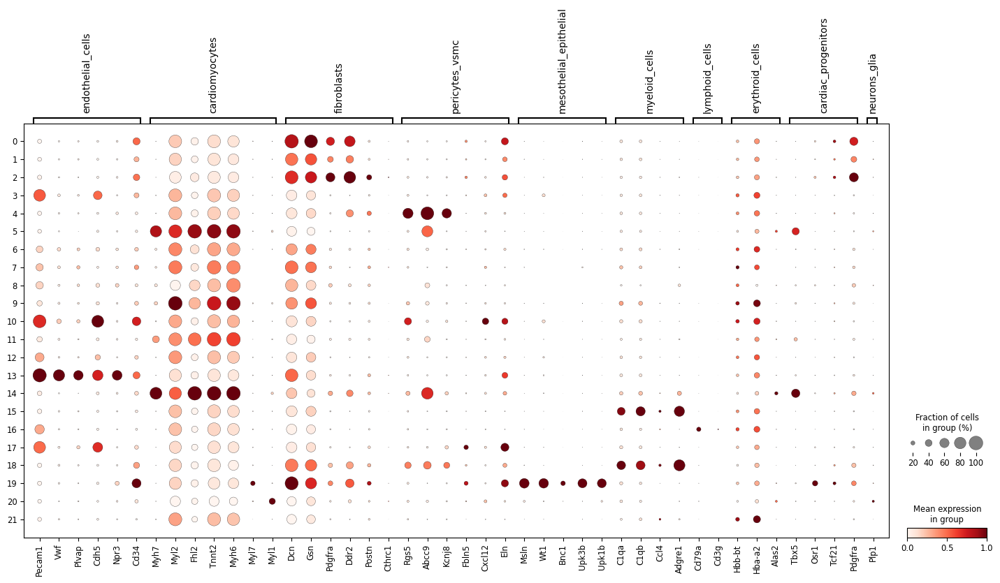

In [72]:
# 4) Dotplot grouped by Leiden clusters (0–15)
sc.pl.dotplot(
    adata,
    var_names=marker_genes_combined,
    groupby="leiden_res0_6",
    standard_scale="var",
    dendrogram=False
)

In [73]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/dotplot_markergenes_combined_with_Ery_progenitor_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

In [74]:
# markergenes again combined but without erythrocytes & cardiac progenitor cells 
marker_genes_combined2 = {
    # Endothel / vaskulär
    "endothelial_cells": [
        "Pecam1", "Vwf", "Plvap", "Cdh5", "Npr3", "Cd34"
    ],

    # Cardiomyocytes (ventrikulär + allgemein)
    "cardiomyocytes": [
        "Myh7", "Myl2", "Fhl2", "Tnnt2", "Myh6", "Myl7", "Myl1"
    ],

    # Fibroblasten / stromal
    "fibroblasts": [
        "Dcn", "Gsn", "Pdgfra", "Ddr2", "Postn", "Cthrc1", "Tcf21"
    ],

    # Perizyten / vaskuläre glatte Muskelzellen
    "pericytes_vsmc": [
        "Rgs5", "Abcc9", "Kcnj8", "Fbln5", "Cxcl12", "Eln"
    ],

    # Mesothelial / epithelial-like
    "mesothelial_epithelial": [
        "Msln", "Wt1", "Bnc1", "Upk3b", "Upk1b"
    ],

    # Myeloid / Makrophagen
    "myeloid_cells": [
        "C1qa", "C1qb", "Ccl4", "Adgre1"
    ],

    # Lymphoid (B / T cells)
    "lymphoid_cells": [
        "Cd79a", "Cd3g"
    ],
    

    # Nerval / glial
    "neurons_glia": [
        "Plp1"
    ]
}

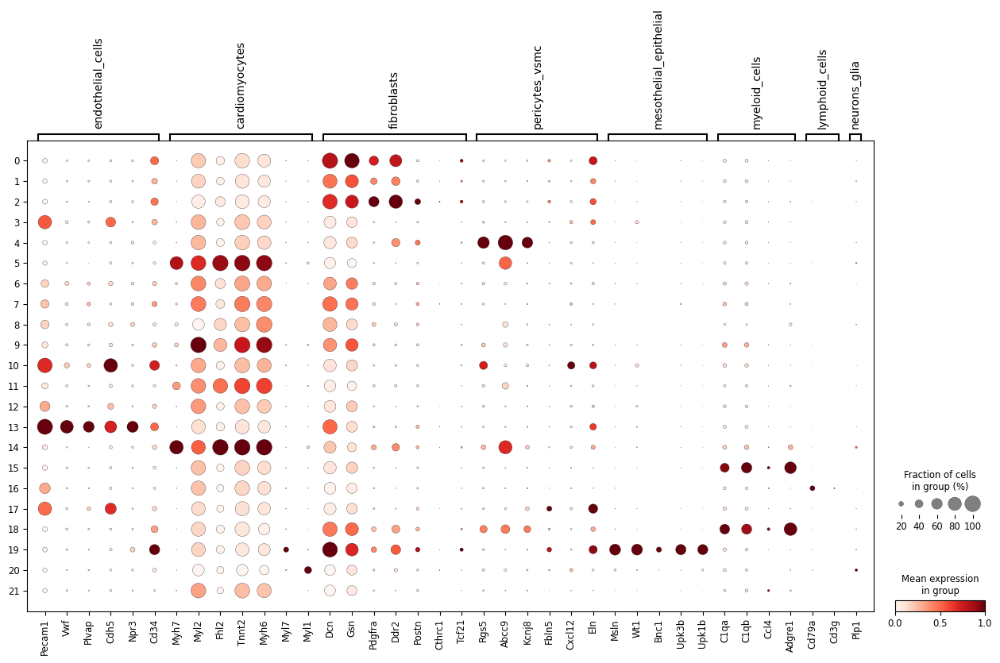

In [75]:
# 4) Dotplot grouped by Leiden clusters (0–15)
sc.pl.dotplot(
    adata,
    var_names=marker_genes_combined2,
    groupby="leiden_res0_6",
    standard_scale="var",
    dendrogram=False
)

In [76]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/dotplot_markergenes_combined_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

## Annotation of cluster

In [15]:
cl_annotation = {
    "0": "fibroblasts",
    "1": "fibroblasts",
    "2": "fibroblasts",
    "3": "endothel cells",
    "4": "pericytes",
    "5": "cardiomyocytes",
    "6": "cardiomyocytes",
    "7": "cardiomyocytes",
    "8": "cardiomyocytes",
    "9": "cardiomyocytes",
    "10": "endothel cells",
    "11": "cardiomyocytes",
    "12": "endothel cells",
    "13": "endothel cells",
    "14": "cardiomyocytes",
    "15": "myeloid cells",
    "16": "lymphoid cells",
    "17": "endothel cells",
    "18": "myeloid cells",
    "19": "mesothelial_epithelial cells",
    "20": "neuronal cells",
    "21": "myeloid cells"
}

In [16]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_res0_6.map(cl_annotation)

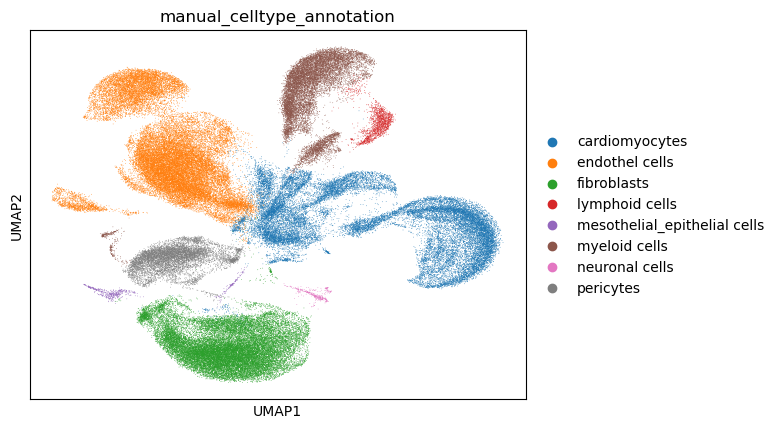

In [17]:
sc.pl.umap(adata, color=["manual_celltype_annotation"])

In [19]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/UMAP_manual_celltype_annotation_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

### save object with celltype annotation

In [20]:
adata

AnnData object with n_obs × n_vars = 111118 × 20681
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'soupx_groups', 'scDblFinder_score', 'scDblFinder_class', 'sample', 'condition', 'size_factors', 'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'leiden_res0_3', 'leiden_res0_4', 'leiden_res0_6', 'leiden_res0_7', 'leiden_res0_8', 'manual_celltype_annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', '

In [21]:
adata.write("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/adata_after_cell_annotation.h5ad")

## rank Top20 genes to find clusters that are not that clear

In [16]:
adata.X

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 207778466 stored elements and shape (111118, 20681)>

In [15]:
type(adata)

anndata._core.anndata.AnnData

In [ ]:
sc.tl.rank_genes_groups(
    adata,
    layer = "log1p_norm",
    groupby="leiden_res0_6",
    method="wilcoxon",
     min_in_group_fraction=0.25, 
     min_fold_change=0.1
)

/home/aumlauf/miniforge3/envs/circ_iri/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/aumlauf/miniforge3/envs/circ_iri/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/aumlauf/miniforge3/envs/circ_iri/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:

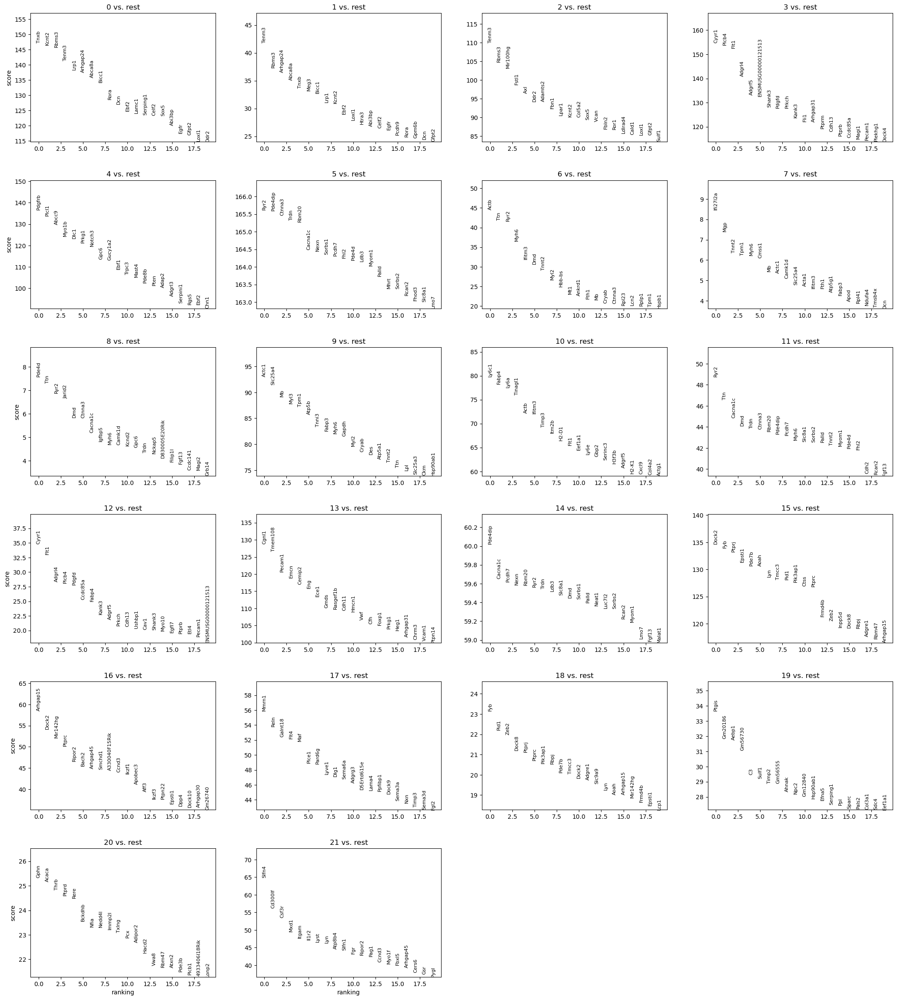

In [12]:
sc.pl.rank_genes_groups(
    adata,
    n_genes=20,
    sharey=False
)

In [124]:
plt.savefig("/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/TOP20_DEG_ranked_batch_corrected_plot.png")

<Figure size 640x480 with 0 Axes>

# get barcodes of cell types

In [122]:
# TXT with barcode names of MC
adata.obs.index[adata.obs["manual_celltype_annotation"] == 'myeloid cells']

Index(['AAACCCGCATAGAGAG-1-S26_17', 'AAACGCCTCTCACTTA-1-S26_17',
       'AAACGTCCATCCGCTG-1-S26_17', 'AAACTCCGTTGAATGG-1-S26_17',
       'AAAGCAATCGCTCAGG-1-S26_17', 'AAAGCCTCAATTGCCC-1-S26_17',
       'AAATGAGTCAATTAGC-1-S26_17', 'AAATGAGTCCGCCATC-1-S26_17',
       'AAATGCAAGTCGAATT-1-S26_17', 'AAATGGATCAGGTTGC-1-S26_17',
       ...
       'TGTCTAAGTTTACCGG-1-S26_32', 'TGTCTGTTCGCATCAA-1-S26_32',
       'TGTCTTGCACAGCACA-1-S26_32', 'TGTGAAGGTTTGGAGA-1-S26_32',
       'TGTGCCTCATAGGTGT-1-S26_32', 'TGTGCCTCATCCTGCG-1-S26_32',
       'TGTGCGCGTAGCTCGC-1-S26_32', 'TGTGCGCGTTATCCAA-1-S26_32',
       'TGTGCTGGTTCTGGAT-1-S26_32', 'TGTGGTCAGGTAATGA-1-S26_32'],
      dtype='object', length=13377)

In [125]:
barcodes = adata.obs.index[
    adata.obs["manual_celltype_annotation"] == "myeloid cells"
]

barcodes.to_series().to_csv(
    "/projects/circ_iri/work/sc_analysis_final/clustering_batch_corrected/myeloid_barcodes.txt",
    index=False,
    header=False
)